In [13]:
# importing preliminary libraries
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [2]:
df=pd.read_csv('used_device_data.csv')

In [3]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
df.head()

,device_brand,os,screen_size,4g,5g,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,release_year,days_used,normalized_used_price,normalized_new_price
0,Honor,Android,14.50,yes,no,13.0,5.0,64.0,3.0,3020.0,146.0,2020,127,4.307572,4.715100
1,Honor,Android,17.30,yes,yes,13.0,16.0,128.0,8.0,4300.0,213.0,2020,325,5.162097,5.519018
2,Honor,Android,16.69,yes,yes,13.0,8.0,128.0,8.0,4200.0,213.0,2020,162,5.111084,5.884631
3,Honor,Android,25.50,yes,yes,13.0,8.0,64.0,6.0,7250.0,480.0,2020,345,5.135387,5.630961
4,Honor,Android,15.32,yes,no,13.0,8.0,64.0,3.0,5000.0,185.0,2020,293,4.389995,4.947837


,device_brand,os,screen_size,4g,5g,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,release_year,days_used,normalized_used_price,normalized_new_price
0,Honor,Android,14.50,yes,no,13.0,5.0,64.0,3.0,3020.0,146.0,2020,127,4.307572,4.715100
1,Honor,Android,17.30,yes,yes,13.0,16.0,128.0,8.0,4300.0,213.0,2020,325,5.162097,5.519018
2,Honor,Android,16.69,yes,yes,13.0,8.0,128.0,8.0,4200.0,213.0,2020,162,5.111084,5.884631
3,Honor,Android,25.50,yes,yes,13.0,8.0,64.0,6.0,7250.0,480.0,2020,345,5.135387,5.630961
4,Honor,Android,15.32,yes,no,13.0,8.0,64.0,3.0,5000.0,185.0,2020,293,4.389995,4.947837


In [5]:
df.info()

In [ ]:
df.describe()

,screen_size,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,release_year,days_used,normalized_used_price,normalized_new_price
count,3454.000000,3275.000000,3452.000000,3450.000000,3450.000000,3448.000000,3447.000000,3454.000000,3454.000000,3454.000000,3454.000000
mean,13.713115,9.460208,6.554229,54.573099,4.036122,3133.402697,182.751871,2015.965258,674.869716,4.364712,5.233107
std,3.805280,4.815461,6.970372,84.972371,1.365105,1299.682844,88.413228,2.298455,248.580166,0.588914,0.683637
min,5.080000,0.080000,0.000000,0.010000,0.020000,500.000000,69.000000,2013.000000,91.000000,1.536867,2.901422
25%,12.700000,5.000000,2.000000,16.000000,4.000000,2100.000000,142.000000,2014.000000,533.500000,4.033931,4.790342
50%,12.830000,8.000000,5.000000,32.000000,4.000000,3000.000000,160.000000,2015.500000,690.500000,4.405133,5.245892
75%,15.340000,13.000000,8.000000,64.000000,4.000000,4000.000000,185.000000,2018.000000,868.750000,4.755700,5.673718
max,30.710000,48.000000,32.000000,1024.000000,12.000000,9720.000000,855.000000,2020.000000,1094.000000,6.619433,7.847841


In [7]:
# checking for null values in the dataset. 
# If there are nulls this could effect the prediction so we are going to fill null values with mode.
# this dataset has a lot of categorical data and filling with mode is the best option for categorical data.
# We will later impute these missing values.
print(df.isnull().sum())

device_brand               0
os                         0
screen_size                0
4g                         0
5g                         0
rear_camera_mp           179
front_camera_mp            2
internal_memory            4
ram                        4
battery                    6
weight                     7
release_year               0
days_used                  0
normalized_used_price      0
normalized_new_price       0
dtype: int64


In [8]:
# Finding duplicates in the dataset
duplicates=df[df.duplicated()]

In [9]:
# normally if there are duplicates then we will delete duplicates as this will cause overfitting of data.
# There are no duplicates in our case.
len(duplicates)

0

Text(0.5, 1.0, 'Correlation Matrix')

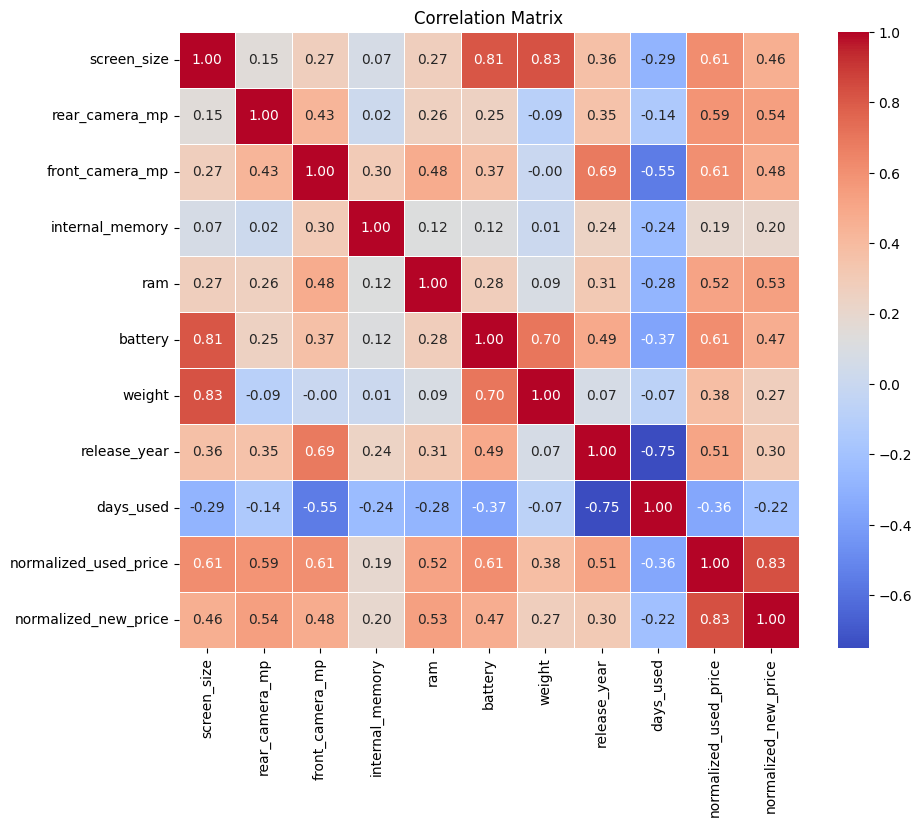

In [15]:
# checking for correlation between data in the correlation matrix 
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
num_df = df[numerical_cols]
correlation_matrix = num_df.corr()
plt.figure(figsize=(10, 8))  # Adjust the figure size as needed
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix')


C:\Users\netaj\miniconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


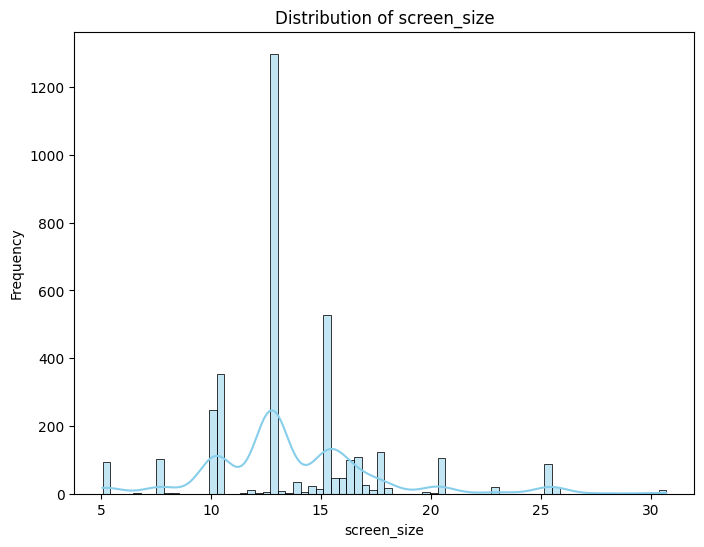

C:\Users\netaj\miniconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


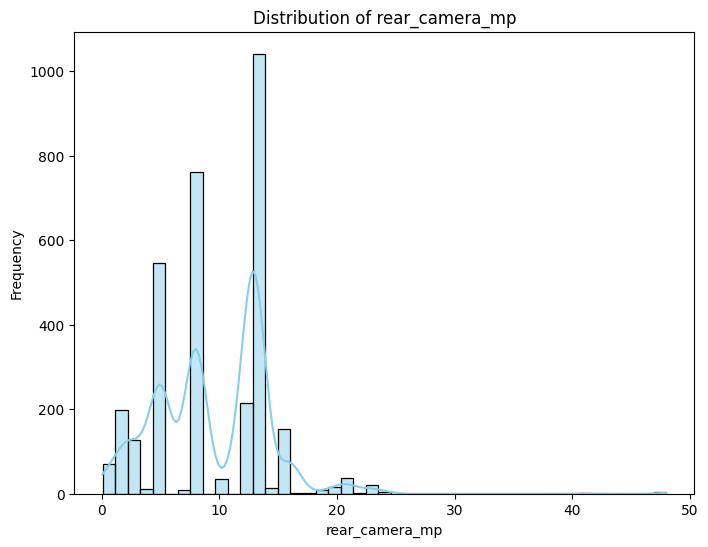

C:\Users\netaj\miniconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


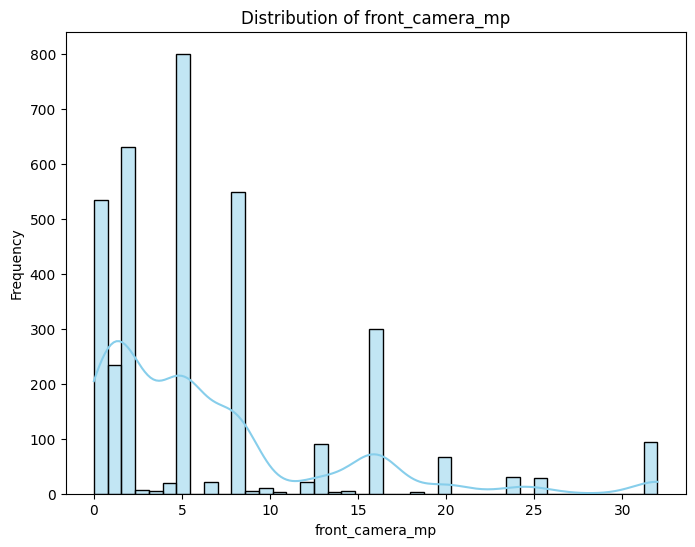

C:\Users\netaj\miniconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


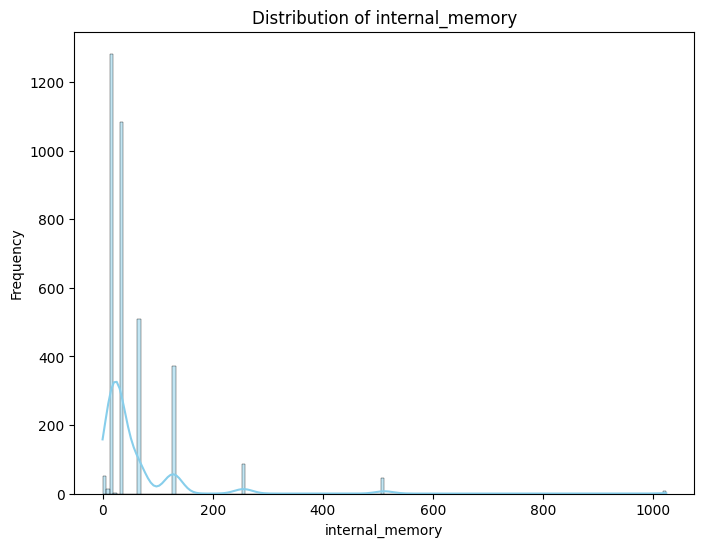

C:\Users\netaj\miniconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


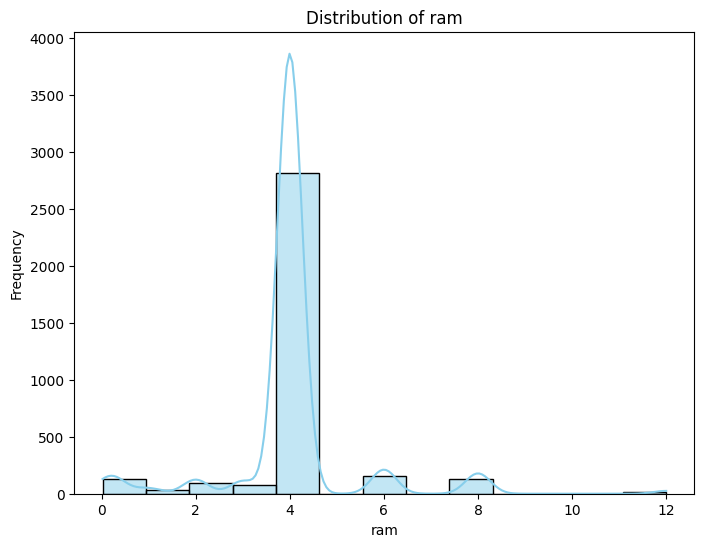

C:\Users\netaj\miniconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


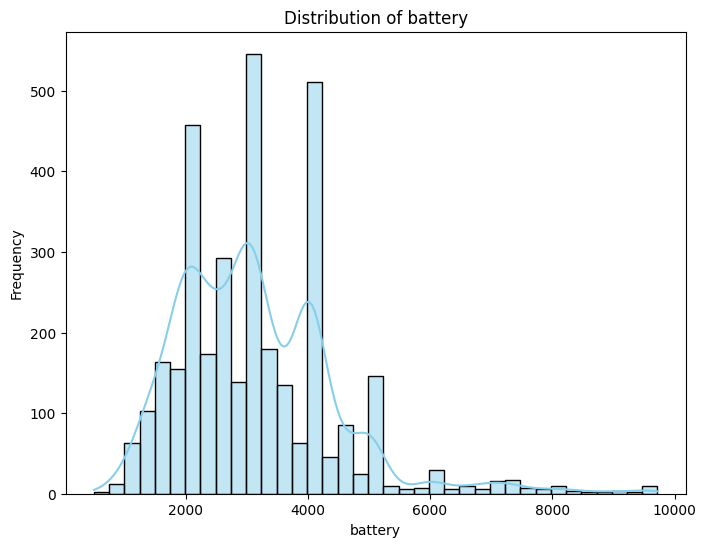

C:\Users\netaj\miniconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


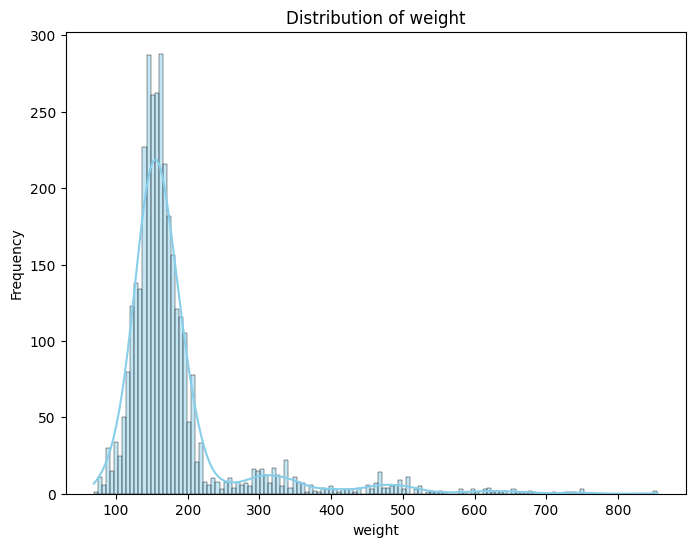

C:\Users\netaj\miniconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


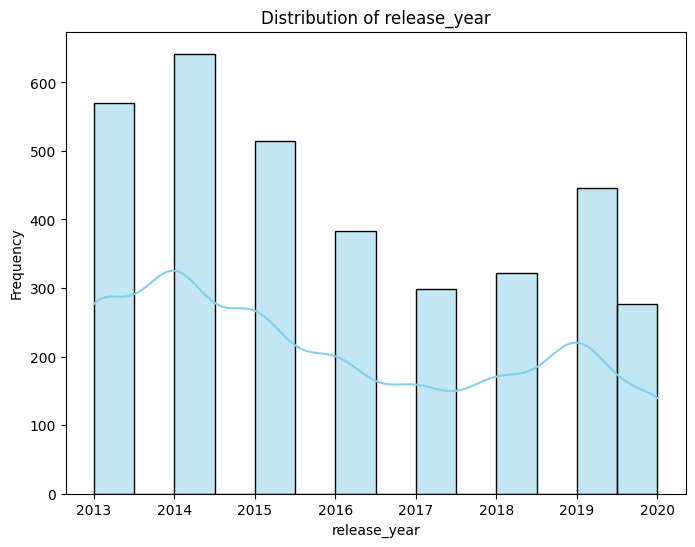

C:\Users\netaj\miniconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


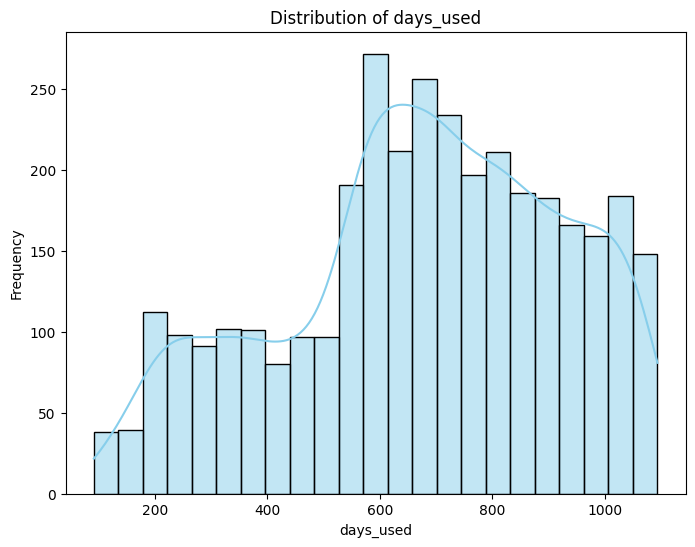

C:\Users\netaj\miniconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


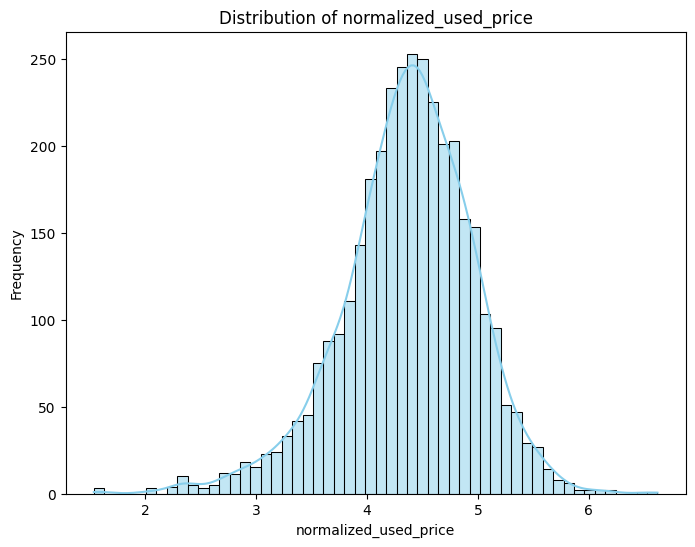

C:\Users\netaj\miniconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


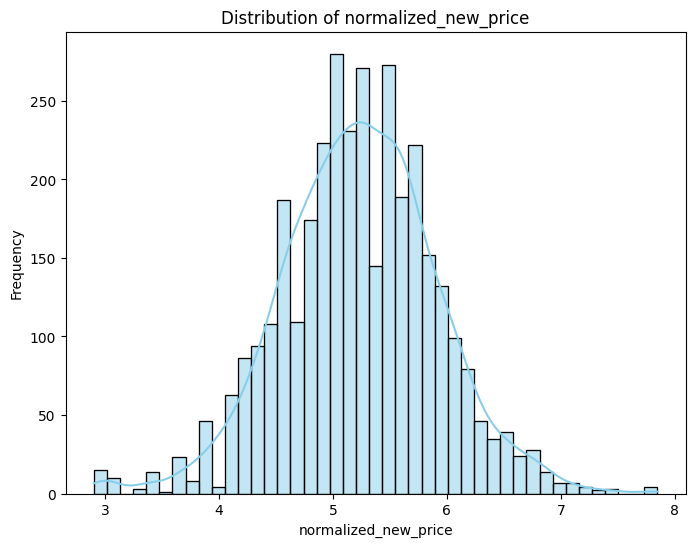

In [16]:
# understanding the distribution of categorical and numerical columns 
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.histplot(df[col], kde=True, color='skyblue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

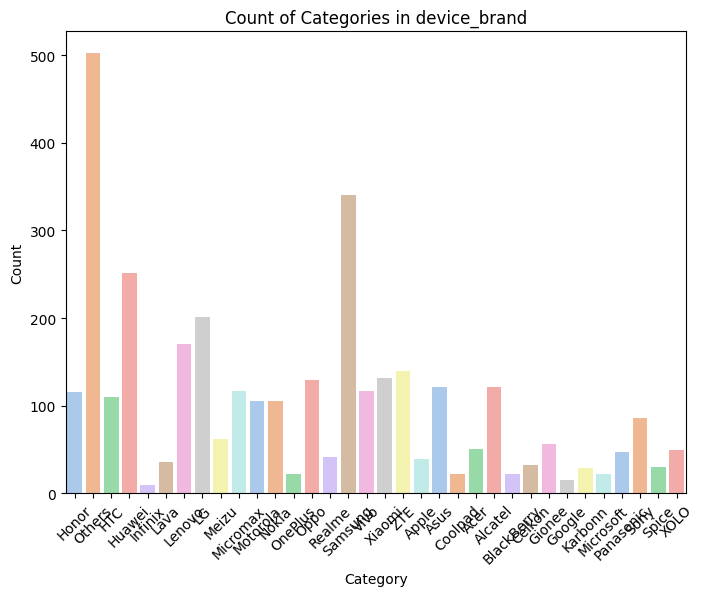

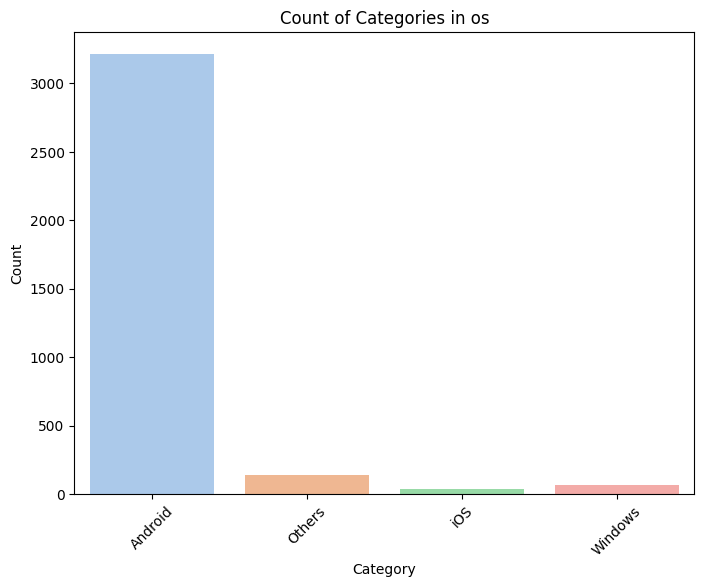

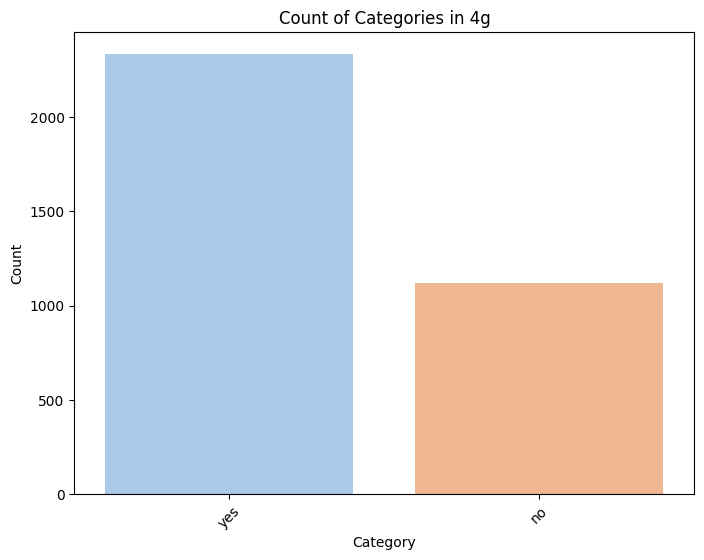

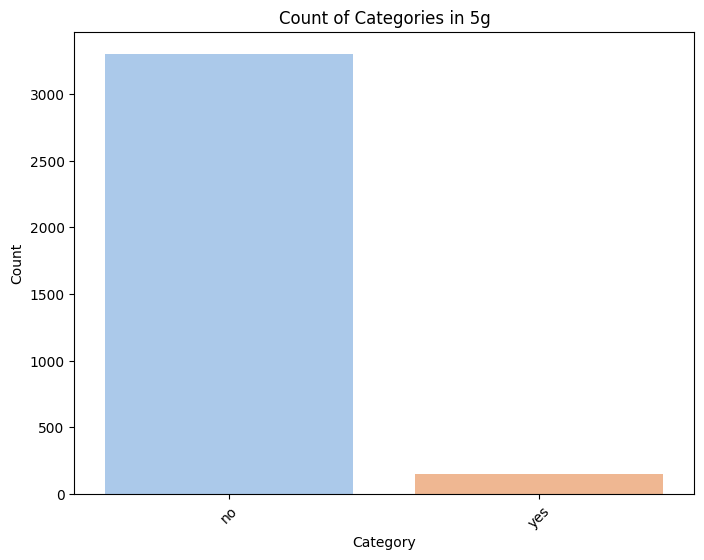

In [17]:
categorical_cols = df.select_dtypes(include=['object']).columns
for i in categorical_cols:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=i, data=df, palette='pastel')
    plt.title(f'Count of Categories in {i}')
    plt.xlabel('Category')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

In [18]:
# understanding distribution of categorical and numerical columns will tell us if the data is skewed towards some values.
# We can see in the discribution that data is skewed towards android devices.
# Data has less entries for 5g mobiles.

In [19]:
# filling missing values with mode as most of the data is categorical and has only certain set of values
# Loop through each column and fill missing values with mode
for col in df.columns:
    mode_val = df[col].mode()[0]  # Find the mode for the column
    df[col].fillna(mode_val, inplace=True)  # Fill missing values with the mode value

# Check if any missing values remain
print(df.isnull().sum())

device_brand             0
os                       0
screen_size              0
4g                       0
5g                       0
rear_camera_mp           0
front_camera_mp          0
internal_memory          0
ram                      0
battery                  0
weight                   0
release_year             0
days_used                0
normalized_used_price    0
normalized_new_price     0
dtype: int64


C:\Users\netaj\AppData\Local\Temp\ipykernel_11880\1643071235.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(mode_val, inplace=True)  # Fill missing values with the mode value
C:\Users\netaj\AppData\Local\Temp\ipykernel_11880\1643071235.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values a

In [20]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
import shap
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [21]:
# One hot encoding categorical columns with prefix
for i in categorical_cols:
    df = pd.concat([df, pd.get_dummies(df[i], prefix=i)], axis=1)
    df = df.drop(i, axis=1)

In [22]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# Normalize numerical columns
df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

In [23]:
from xgboost import XGBRegressor
# Assuming 'X' contains your feature columns and 'y' contains your target variable
X = df.drop('normalized_used_price', axis=1)
y = df['normalized_used_price']

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

# Train Random Forest model
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train, y_train)


# Predictions
lr_pred = lr_model.predict(X_test)
rf_pred = rf_model.predict(X_test)

# Evaluate models
print("Linear Regression:")
print("Mean Squared Error:", mean_squared_error(y_test, lr_pred))
print("R-squared:", r2_score(y_test, lr_pred))

print("\nRandom Forest:")
print("Mean Squared Error:", mean_squared_error(y_test, rf_pred))
print("R-squared:", r2_score(y_test, rf_pred))



Linear Regression:
Mean Squared Error: 0.002076751305602483
R-squared: 0.8346854564662956

Random Forest:
Mean Squared Error: 0.0018319434887497659
R-squared: 0.854172764545656


[0]	train-rmse:0.12426	eval-rmse:0.12162
[50]	train-rmse:0.04549	eval-rmse:0.04577
[100]	train-rmse:0.04097	eval-rmse:0.04254
[150]	train-rmse:0.03965	eval-rmse:0.04217
[200]	train-rmse:0.03858	eval-rmse:0.04210
[250]	train-rmse:0.03769	eval-rmse:0.04190
[300]	train-rmse:0.03681	eval-rmse:0.04198
[350]	train-rmse:0.03604	eval-rmse:0.04226
[400]	train-rmse:0.03535	eval-rmse:0.04231
[450]	train-rmse:0.03467	eval-rmse:0.04241
[499]	train-rmse:0.03408	eval-rmse:0.04249


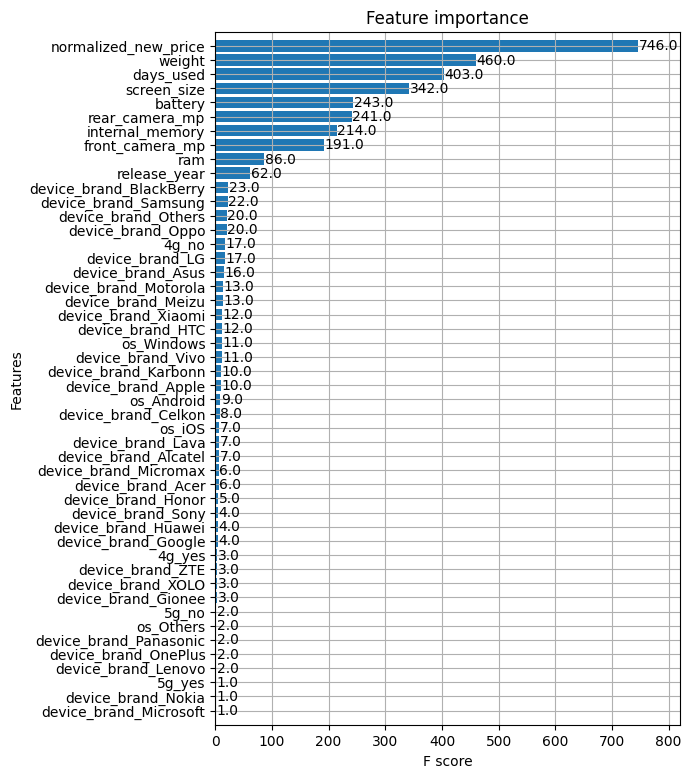

Mean Squared Error: 0.001805633347215871
R-squared: 0.8562671169248982


In [24]:
import xgboost  as xgb
xgb_params = {
    'max_depth': 3, 
    'eta': 0.05, 
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'objective': 'reg:squarederror',  
    'eval_metric': 'rmse',           
    'seed': 0
}

dtrain = xgb.DMatrix(X_train, y_train)
dtest = xgb.DMatrix(X_test, y_test)
evals = [(dtrain,'train'),(dtest,'eval')]
xgb_model = xgb.train (params = xgb_params,
              dtrain = dtrain,
              num_boost_round = 2000,
              verbose_eval=50, 
              early_stopping_rounds = 500,
              evals=evals,
              #feval = f1_score_cust,
              maximize = True)
 
# plot the important features  
fig, ax = plt.subplots(figsize=(6,9))
xgb.plot_importance(xgb_model,  height=0.8, ax=ax)
plt.show()

y_pred = xgb_model.predict(dtest)

# Calculate mean squared error
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

# Calculate R-squared score
r2 = r2_score(y_test, y_pred)
print("R-squared:", r2)

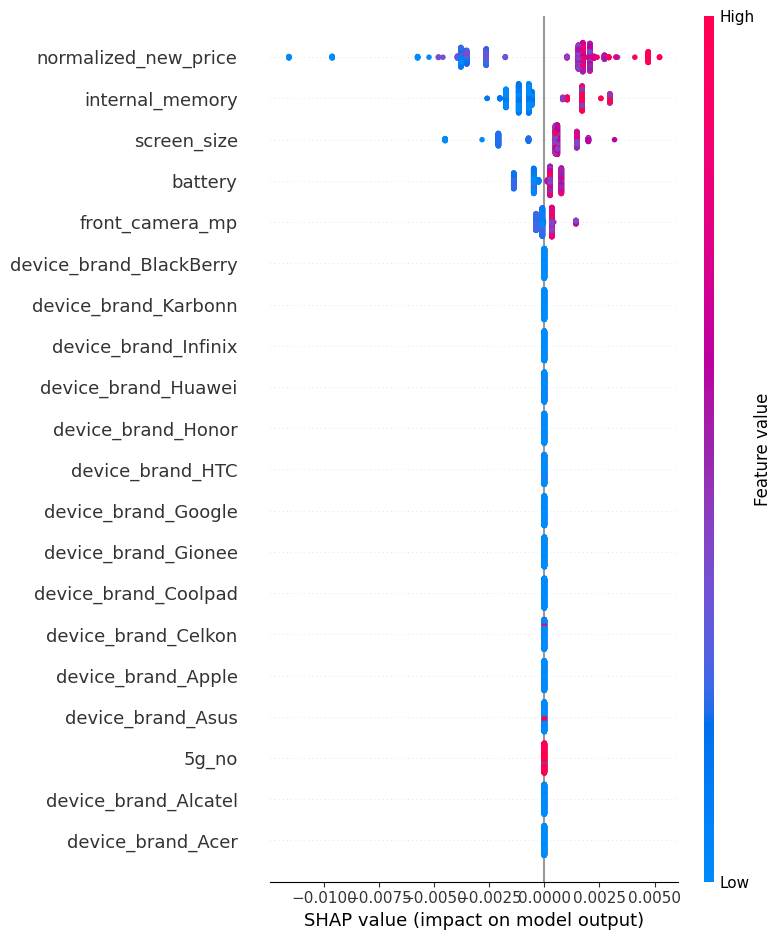

In [25]:
import shap

# Create a TreeExplainer object
explainer = shap.TreeExplainer(xgb_model)

# Calculate Shapley values for the test data
shap_values = explainer.shap_values(X_test)

# Plot the SHAP summary plot
shap.summary_plot(shap_values, X_test)

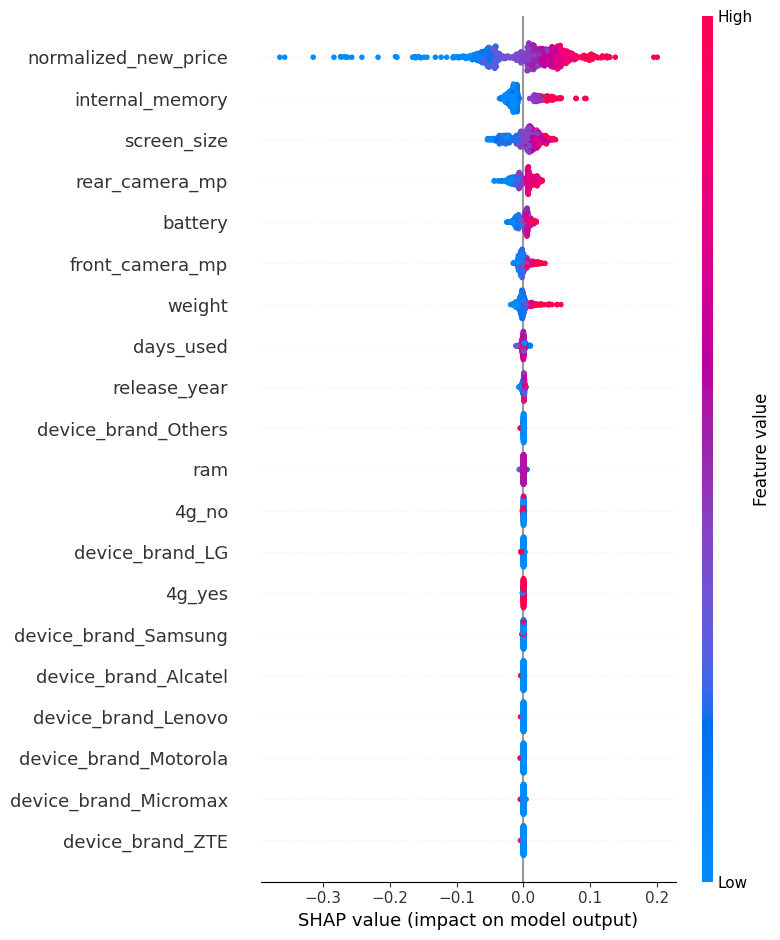

In [27]:
# Create a TreeExplainer object
explainer_rf = shap.TreeExplainer(rf_model)

# Calculate Shapley values for the test data
shap_values_rf = explainer_rf.shap_values(X_test)

# Plot the SHAP summary plot
shap.summary_plot(shap_values_rf, X_test)
